# Importing the libraries

In [3]:
import os
import random
import cv2
import re
import sys
import imutils
import pytesseract
from re import A
import numpy as np
import pandas as pd
from pytesseract import Output
import matplotlib.pyplot as plt
from PIL import ImageFont, ImageDraw, Image
from PIL import Image
sys.path.append('./src/') 
from img_utils import download_images

# Loading the datasets

In [5]:
DATASET_FOLDER = './dataset/'
sample_data = pd.read_csv(os.path.join(DATASET_FOLDER, 'data.csv'))

## Importing download_images function from img_utils

In [7]:
# download_images(sample_data['image_link'], sample_data['group_id'], '../images')
# assert len(os.listdir('../images')) > 0

### Show image function

In [9]:
directory_imgs = "../images/"
paths = [os.path.join(directory_imgs, f) for f in os.listdir(directory_imgs)]
# print(paths)

In [10]:
def show_img(img):
    fig = plt.gcf()
    fig.set_size_inches(5, 5)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

In [11]:
# for image in paths:
#     print(image)
#     img = cv2.imread(image)
#     show_img(img)

# Text Recognition

In [13]:
gpu = True
min_conf = 10
font = './content/calibri.ttf'
config_tesseract = "--tessdata-dir tessdata"

In [14]:
from easyocr import Reader
reader = Reader(['en'], gpu)

In [15]:
def write_text(text, x, y, img, font, color=(209, 0, 3), font_size=18):
    font = ImageFont.truetype(font, font_size)
    img_pil = Image.fromarray(img)
    draw = ImageDraw.Draw(img_pil)
    draw.text((x, y-font_size), text, font = font, fill = color)
    img = np.array(img_pil)
    return img

In [16]:
def box(i, result, img, color=(209, 0, 3)):
    (lt, rt, br, bl) = result[i][0]
    lt = (int(lt[0]), int(lt[1]))
    rt = (int(rt[0]), int(rt[1]))
    br = (int(br[0]), int(br[1]))
    bl = (int(bl[0]), int(bl[1]))
    cv2.rectangle(img, lt, br, color, 2)

    return lt[0], lt[1], img

In [17]:
def convert_to_equi_unit(value, unit):
    """Convert different units to grams."""
    unit = unit.lower()
    if unit in ['kg', 'kilogram']:
        print(value*1000, 'g')
        return value * 1000   
    elif unit in ['g', 'gram']:
        return value  
    elif unit in ['mg', 'milligram']:
        return value / 1000 
    elif unit in ['litre', 'l']:
        return value * 1000 
    elif unit in ['ml', 'millilitre']:
        return value 
    elif unit in ['cm', 'centimetre']:
        return value / 100
    elif unit in ['mm', 'millimetre']:
        return value / 1000
    elif unit in ['m', 'metre']:
        return value
    elif unit in ['pound']:
        return value*453.6
    elif unit in ['oz', 'ounce']:
        return value*28.35
    else:
        return value  # In case of an unsupported unit


In [18]:
def ocr_process_img(img, config_tesseract, min_conf):
    results = reader.readtext(img)
    results = np.array(results, dtype=object)
    
    #print(results[:,1])
    print('======================================================')
    
    # Select the appropriate pattern based on the entity name
    term_search = r'\(?\d+(?:\.\d+)?\s?(kg|kilogram|g|gram|mg|milligram|lb|pound|oz|ounce|litre|ml|millilitre|gallon|cup|quart|pint|cm|centimetre|mm|millimetre|m|metre|inch|foot)\)?' 

    regex = re.compile(term_search, re.IGNORECASE)
    
    max_value = -1
    max_match = None
    max_box = None
    
    # Loop through all detected text results
    for i in range(0, len(results[:, 1])):
        texts = results[i][1]
        match = re.search(term_search, texts.lower())
        
        if match:
            obj_weight = re.search(r'\d+(?:\.\d+)?', match.group())
            val = float(obj_weight.group())  # Extract the numeric value
            match_unit = r'\(?\s?(kg|kilogram|g|gram|mg|milligram|lb|pound|oz|ounce|litre|ml|millilitre|gallon|cup|quart|pint|cm|centimetre|mm|millimetre|m|metre|inch|foot)\)?'
            entity_unit = re.search(match_unit, match.group())
            unit = entity_unit.group()  # Extract the unit
            
            value = convert_to_equi_unit(val, unit.strip())
            
            if value is not None and value > max_value :
                max_value = value
                max_match = match.group()
                max_box = (i, val, unit)  # Save box information for the max value

    # If we found a valid match with the greatest value, box it
    weight = None
    if max_box:
        i, value, unit = max_box
        weight = str(value) + " " + unit
        x, y, img = box(i, results, img, (209, 0, 3))  # Draw a box around the greatest entity
        img = write_text(max_match, x, y, img, font, (209, 0, 3), 18)  # Write the matched text

    
    return img, weight

1019.jpg
Weight of the object is 1000.0  ml


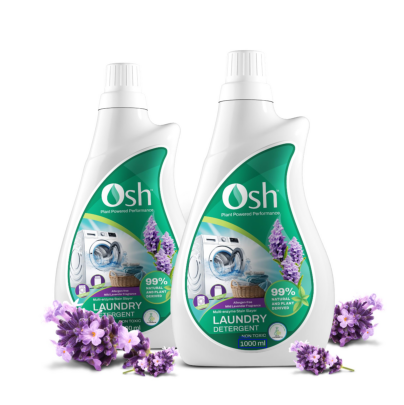

1025.jpg
Unable to detect weight


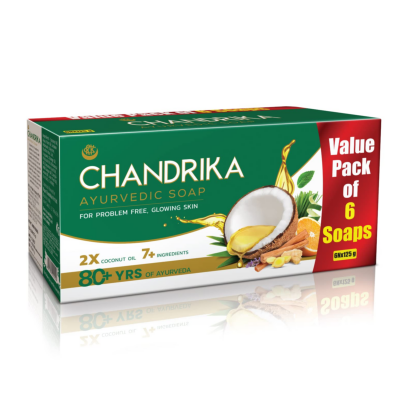

1031.jpg
Weight of the object is 125.0  g


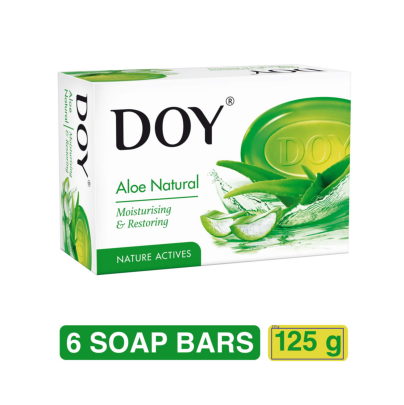

1030.jpg
Unable to detect weight


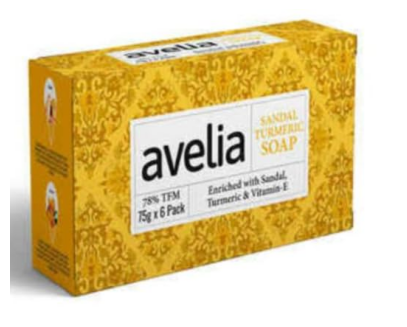

1024.jpg
Weight of the object is 125.0  g


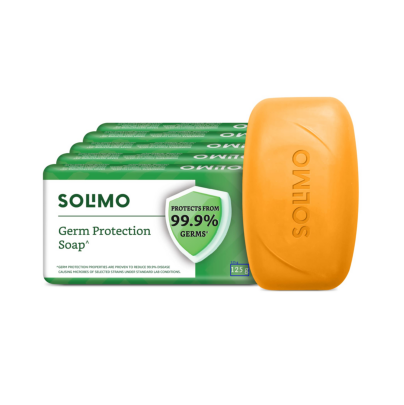

1018.jpg
Unable to detect weight


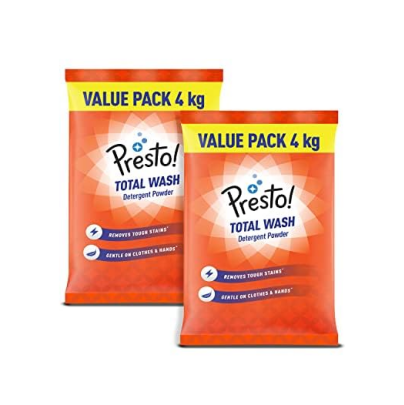

1032.jpg
Weight of the object is 106.0 g)


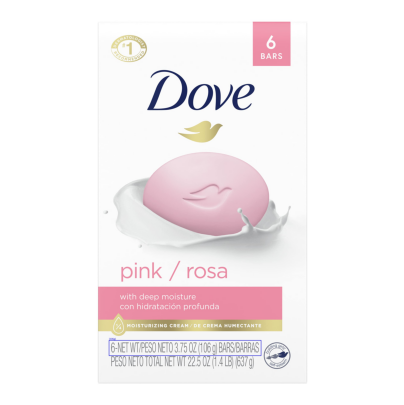

1026.jpg
Weight of the object is 125.0 g


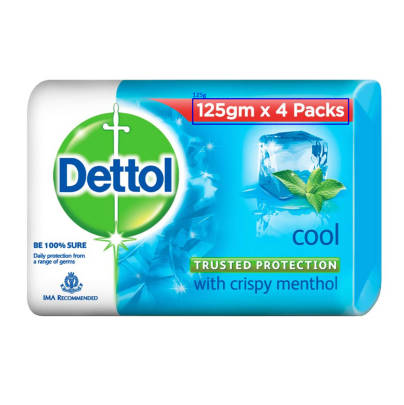

1027.jpg
Weight of the object is 100.0 g


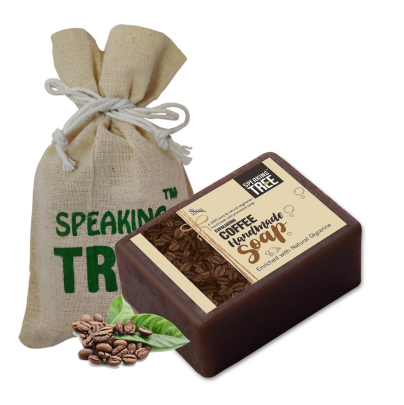

1033.jpg
Unable to detect weight


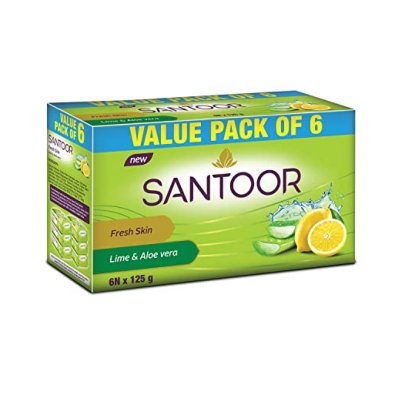

1037.jpg
Weight of the object is 20.0 g


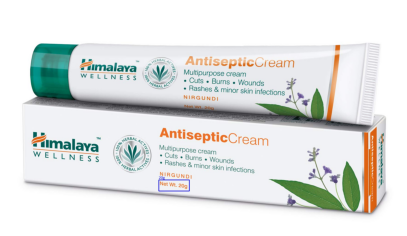

1023.jpg
Unable to detect weight


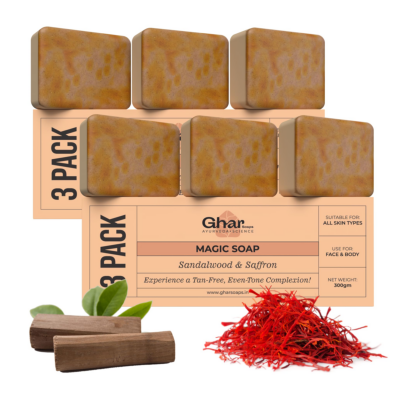

1022.jpg
Unable to detect weight


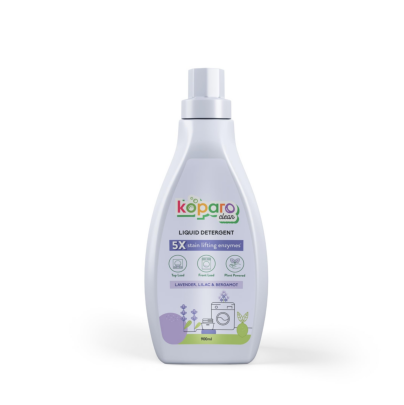

1036.jpg
Unable to detect weight


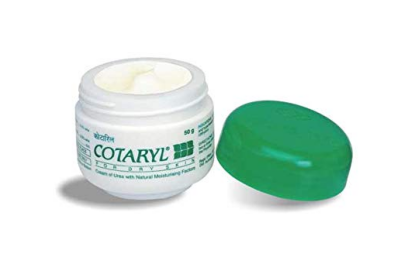

1020.jpg
Unable to detect weight


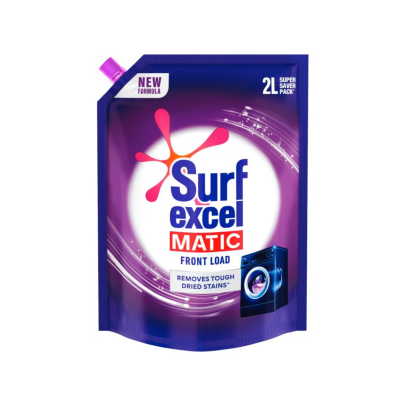

1034.jpg
Weight of the object is 125.0  g


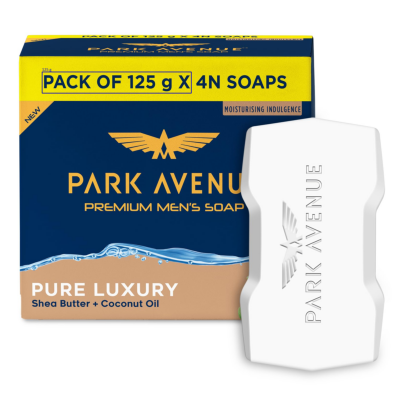

1008.jpg
Unable to detect weight


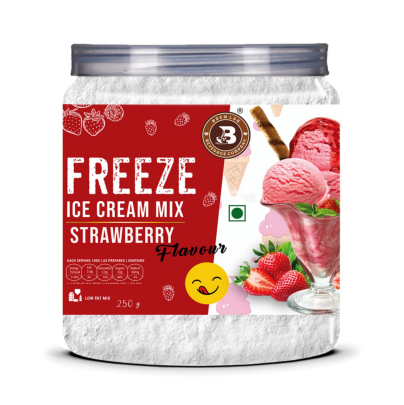

1009.jpg
Weight of the object is 540.0 g


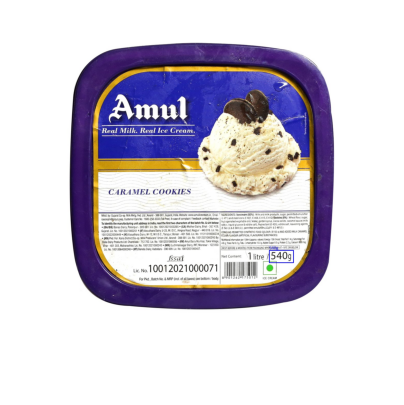

1035.jpg
Weight of the object is 30.0  g


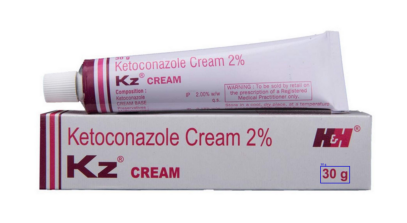

1021.jpg
7000.0 g
8000.0 g
Weight of the object is 8.0 kg


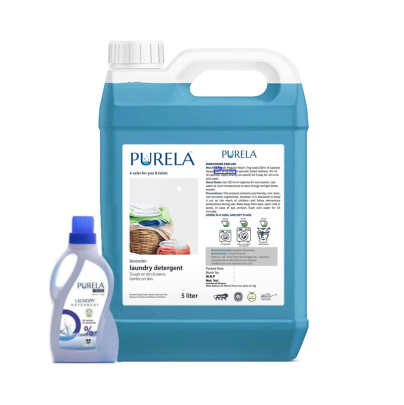

1046.jpg
Weight of the object is 25.0  g


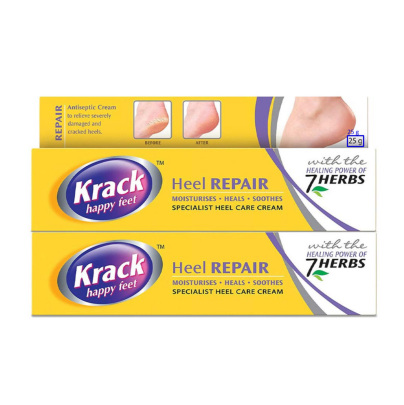

1052.jpg
Unable to detect weight


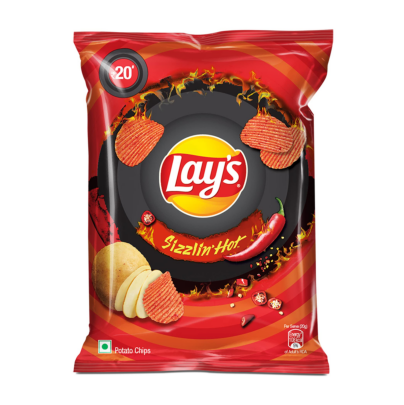

1085.jpg
Weight of the object is 500.0  ml


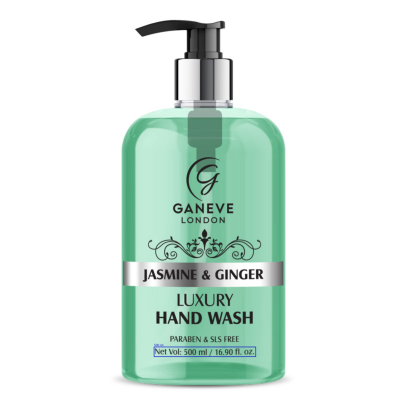

1091.jpg
Weight of the object is 500.0 g


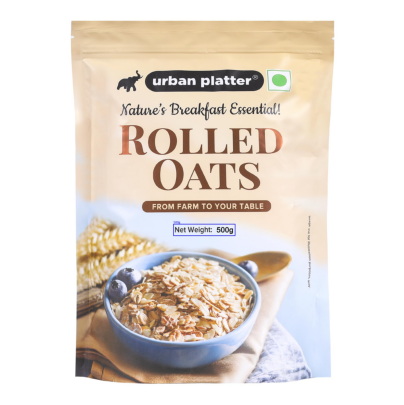

1090.jpg
Unable to detect weight


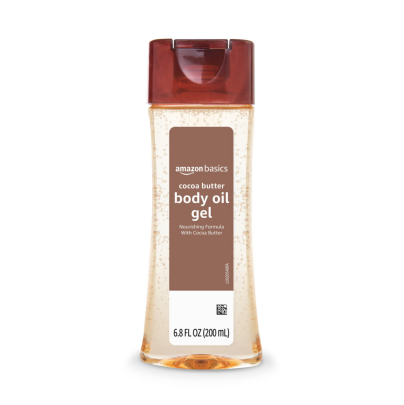

1084.jpg
Weight of the object is 250.0 ml


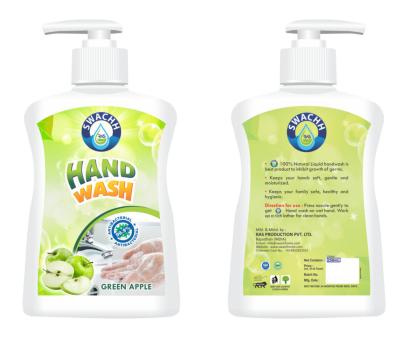

1053.jpg
Weight of the object is 311.0 g)


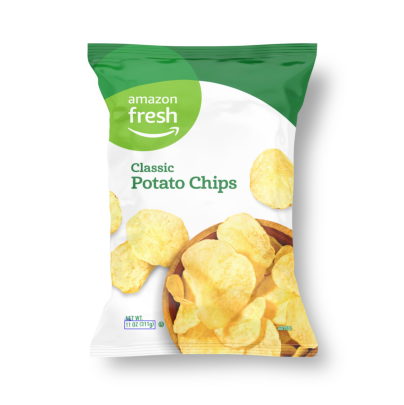

1047.jpg
Weight of the object is 16.2  g)


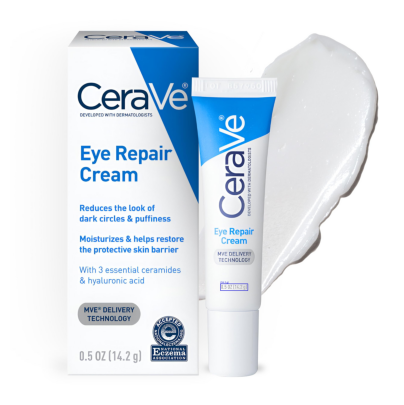

1079.jpg
Weight of the object is 500.0  g


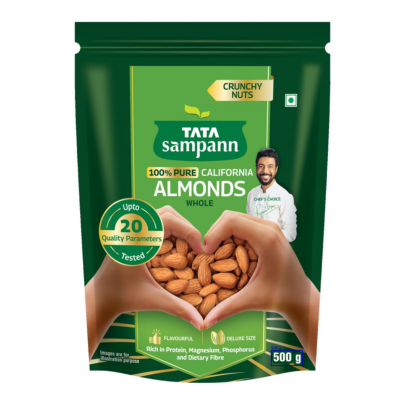

1051.jpg
Weight of the object is 20.0 g


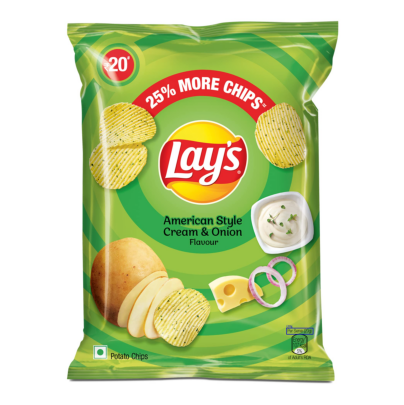

1045.jpg
Weight of the object is 30.0  g


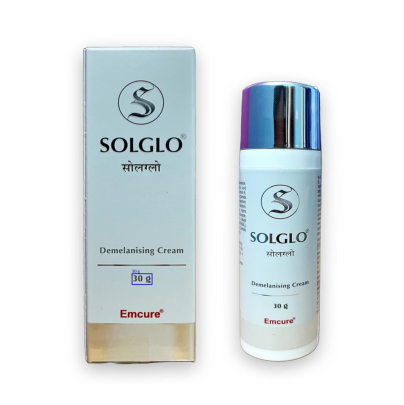

1092.jpg
Weight of the object is 100.0 g


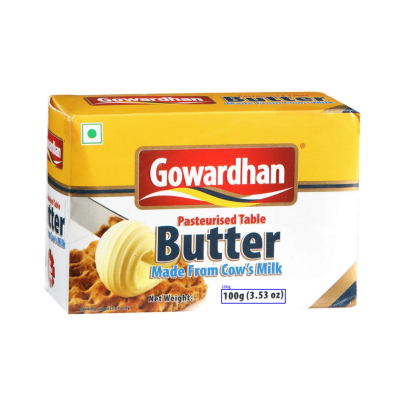

1086.jpg
Unable to detect weight


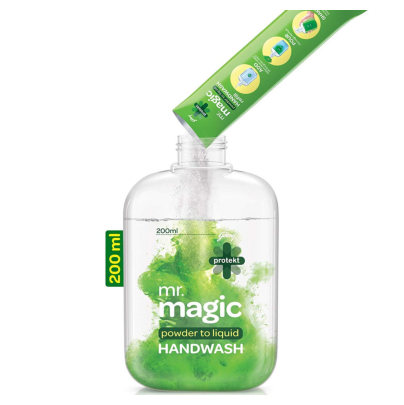

1087.jpg
Weight of the object is 950.0  g


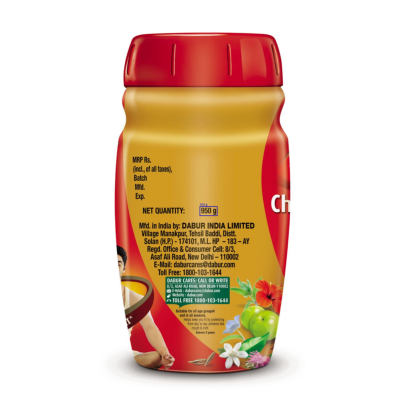

1093.jpg
Weight of the object is 393110.0  g


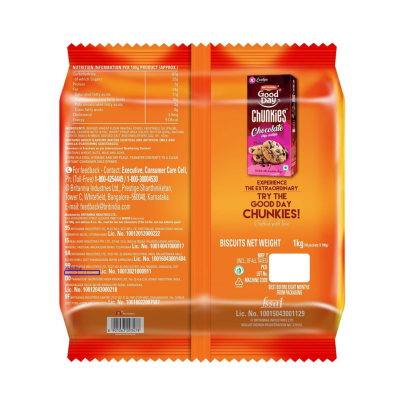

1044.jpg
Weight of the object is 15.0 g


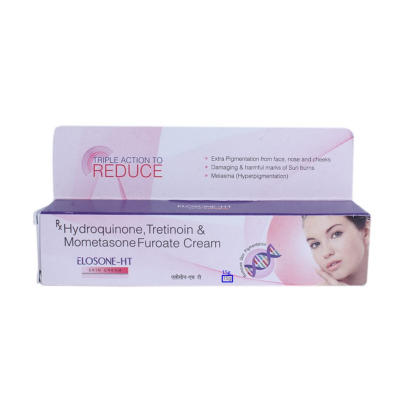

1050.jpg
Weight of the object is 48.0 g)


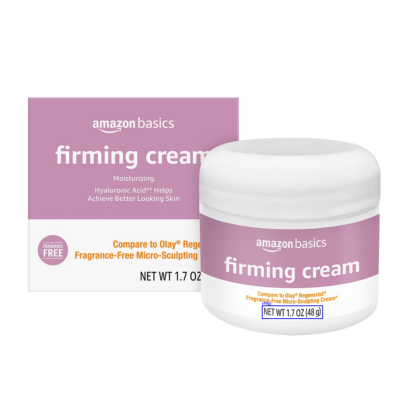

1078.jpg
Weight of the object is 100.0 g


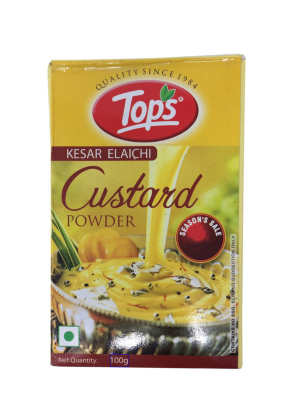

1054.jpg
Weight of the object is 300.0  ml


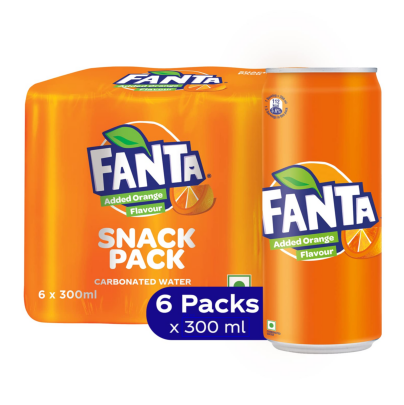

1040.jpg
Unable to detect weight


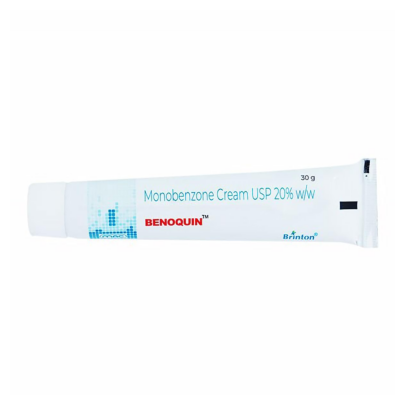

1068.jpg
Weight of the object is 100.0  g


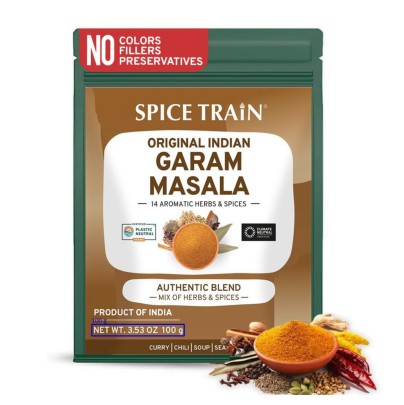

1097.jpg
Unable to detect weight


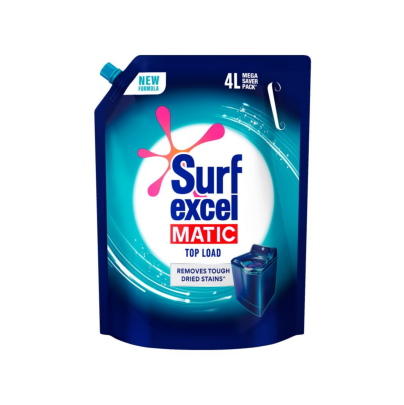

1083.jpg
Unable to detect weight


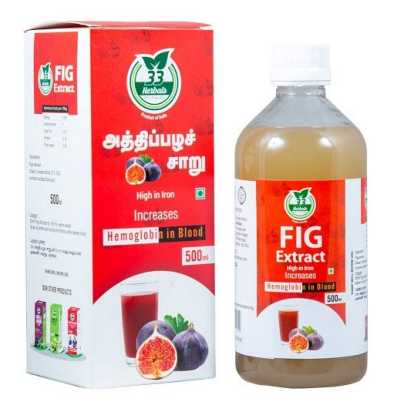

1082.jpg
Unable to detect weight


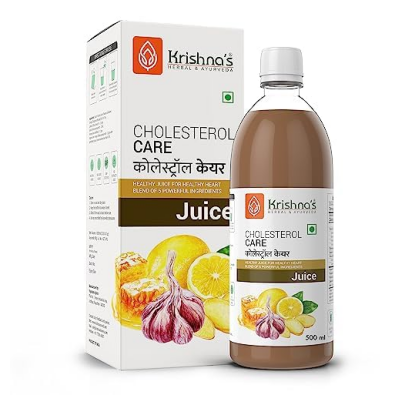

1096.jpg
2000.0 g
Weight of the object is 2.0 kg


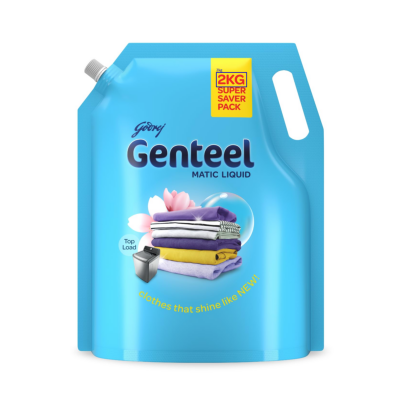

1069.jpg
Weight of the object is 70.0  g


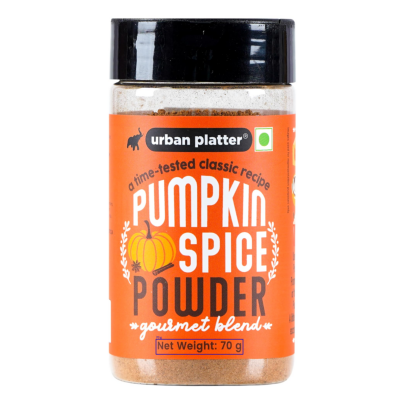

1041.jpg
Weight of the object is 75.0  g


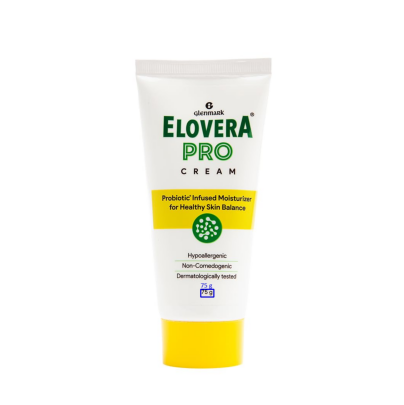

1055.jpg
Weight of the object is 200.0 g


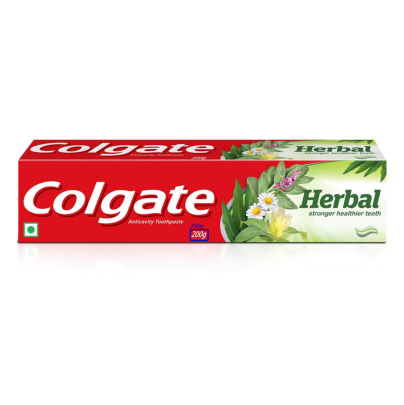

1043.jpg
Unable to detect weight


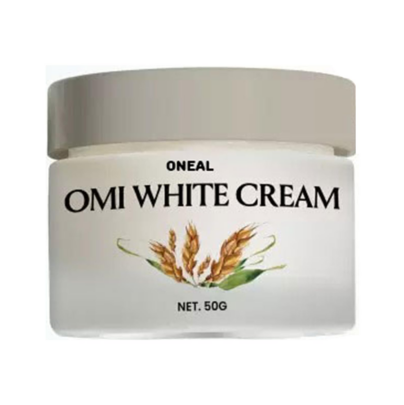

1057.jpg
Unable to detect weight


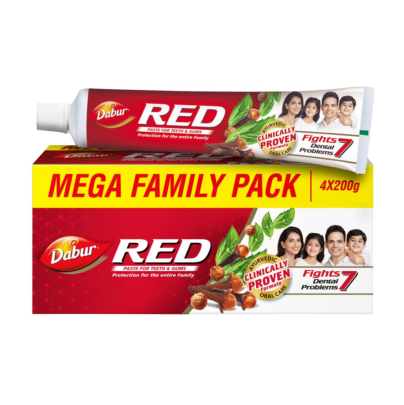

1080.jpg
1000.0 g
Weight of the object is 1.0  kg


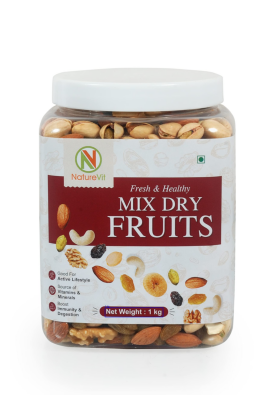

1094.jpg
Weight of the object is 200.0 g


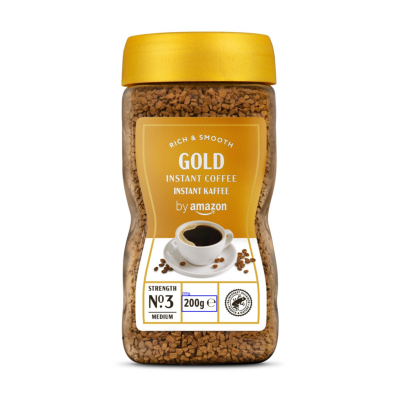

1095.jpg
Unable to detect weight


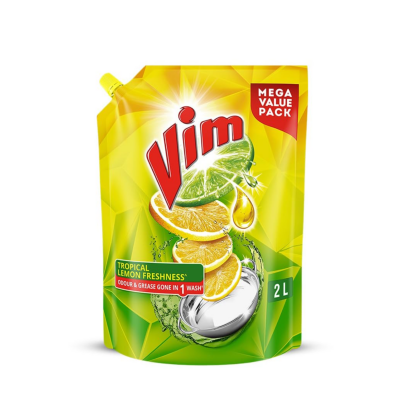

1081.jpg
Weight of the object is 250.0  ml)


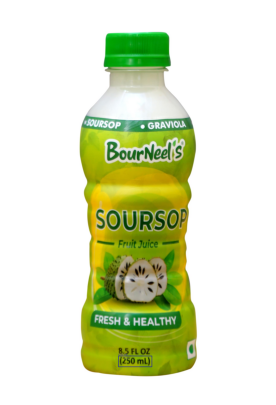

1056.jpg
Weight of the object is 200.0 g


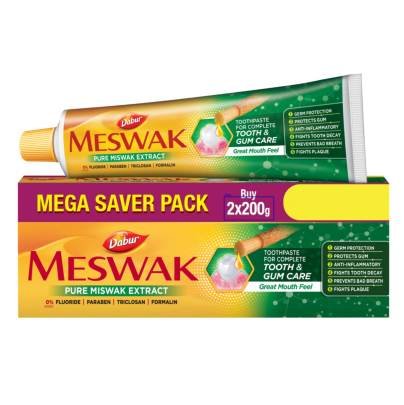

1042.jpg
Weight of the object is 20.0  g


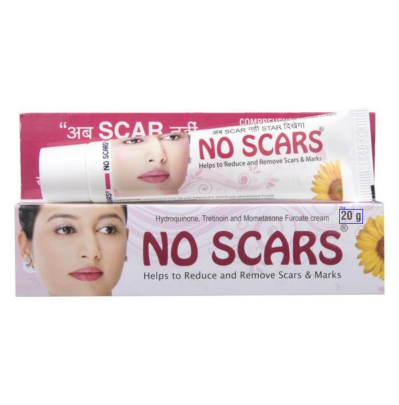

1067.jpg
Weight of the object is 250.0  g


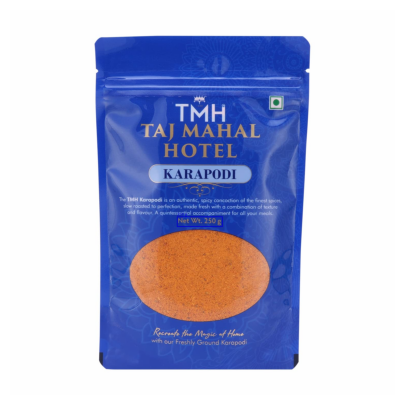

1073.jpg
Weight of the object is 1000.0 g


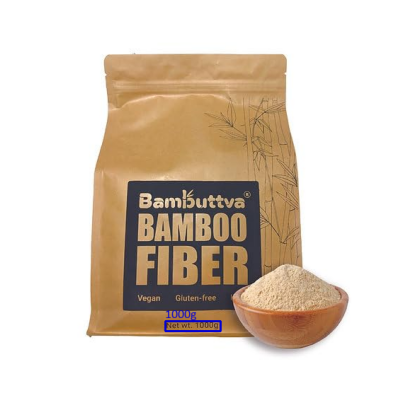

1098.jpg
Unable to detect weight


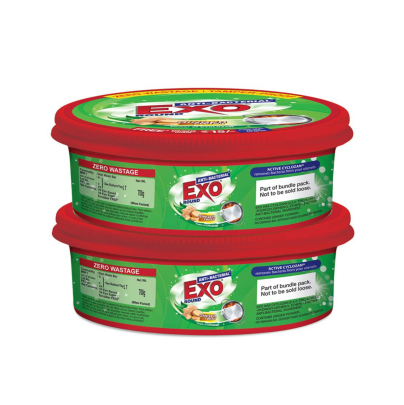

1099.jpg
Weight of the object is 4.5  g


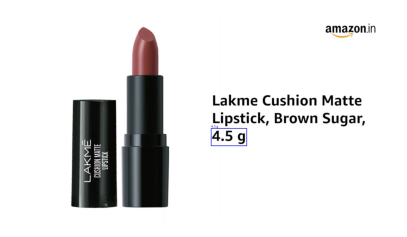

1072.jpg
Unable to detect weight


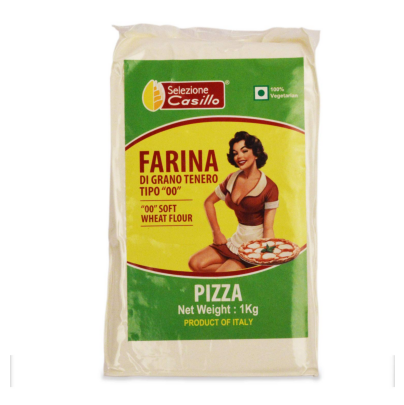

1066.jpg
Weight of the object is 12.0  m


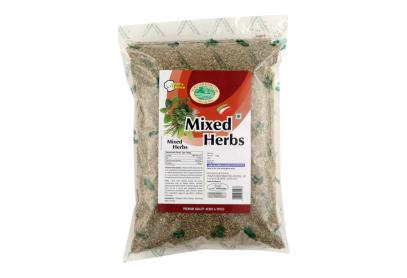

1058.jpg
Weight of the object is 100.0  g


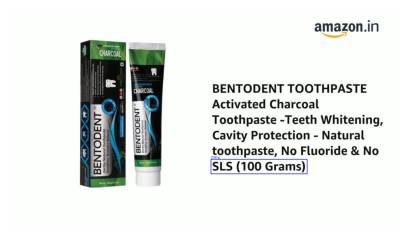

1070.jpg
Unable to detect weight


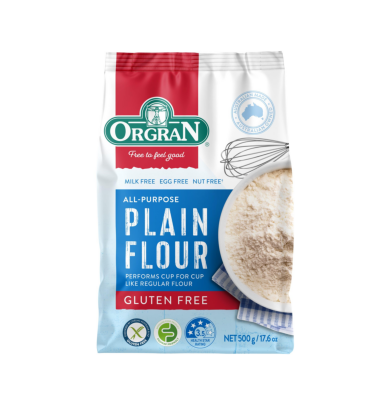

1064.jpg
Weight of the object is 100.0 g


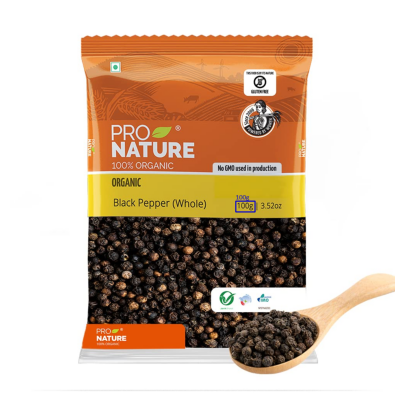

1065.jpg
Weight of the object is 50.0  g


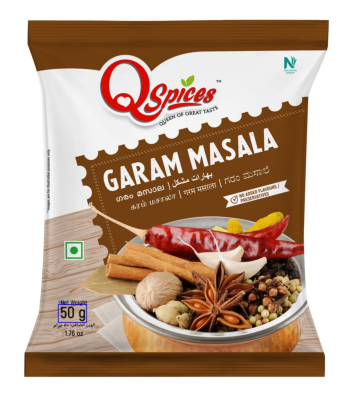

1071.jpg
Weight of the object is 907.0  g)


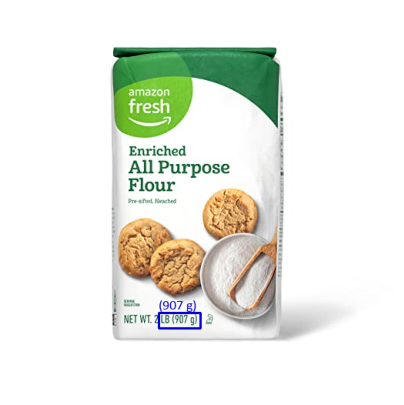

1059.jpg
Weight of the object is 75.0 g


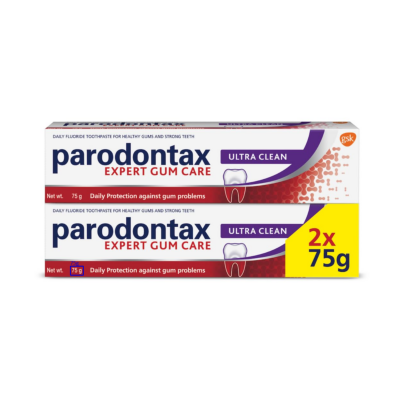

1075.jpg
Unable to detect weight


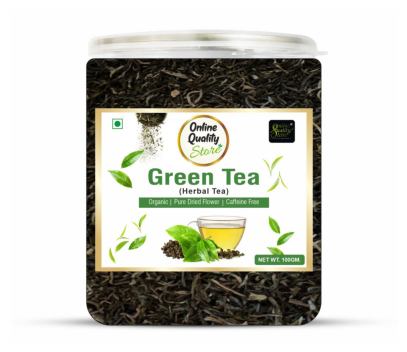

1061.jpg
Unable to detect weight


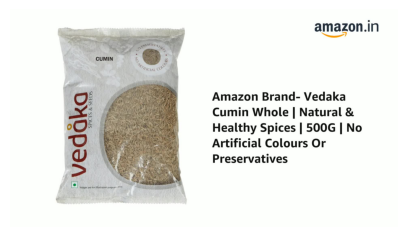

1049.jpg
Unable to detect weight


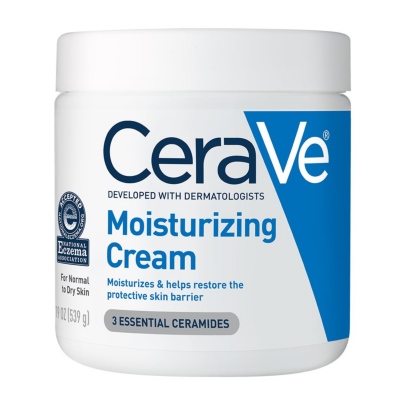

1048.jpg
Weight of the object is 20.0 g


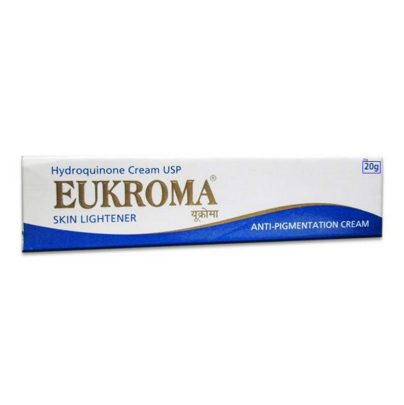

1060.jpg
Weight of the object is 120.0 g


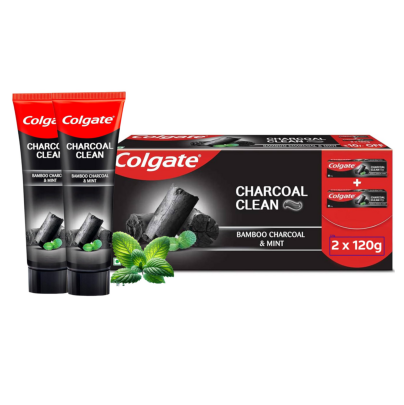

1074.jpg
1000.0 g
Weight of the object is 1.0 kg


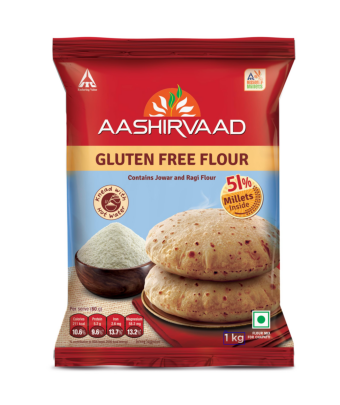

1100.jpg
1000.0 g
Weight of the object is 1.0 kg


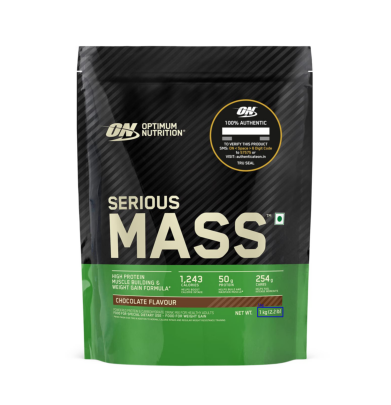

1062.jpg
Weight of the object is 230.0 g


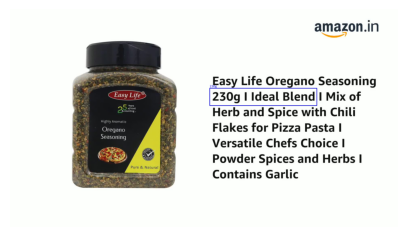

1076.jpg
Weight of the object is 100.0  g


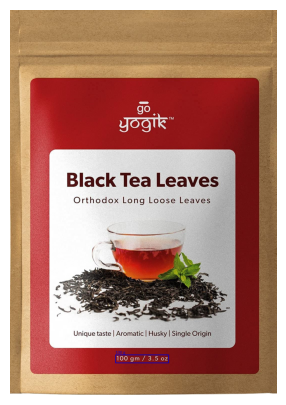

1089.jpg
Weight of the object is 100.0  ml


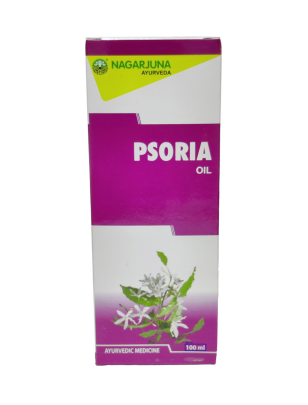

1088.jpg
Weight of the object is 1.0 m


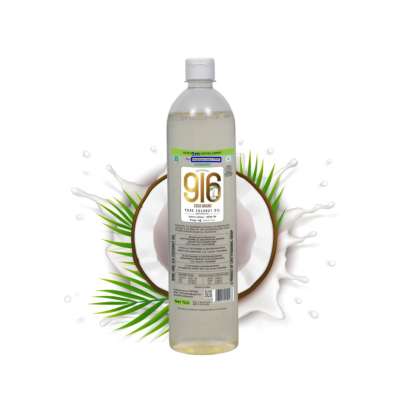

1077.jpg
Weight of the object is 500.0  g


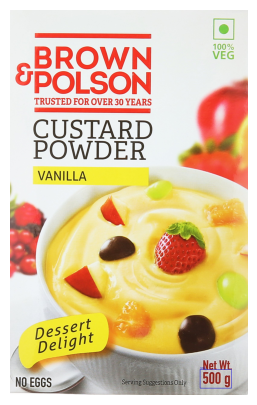

1063.jpg
Unable to detect weight


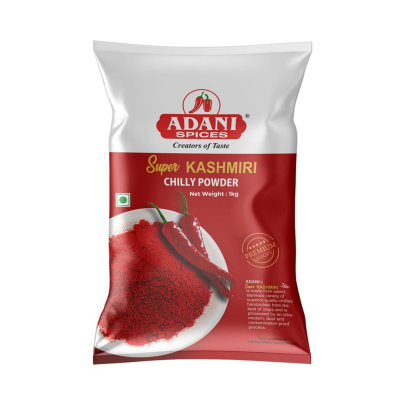

1038.jpg
Weight of the object is 454.0 g)


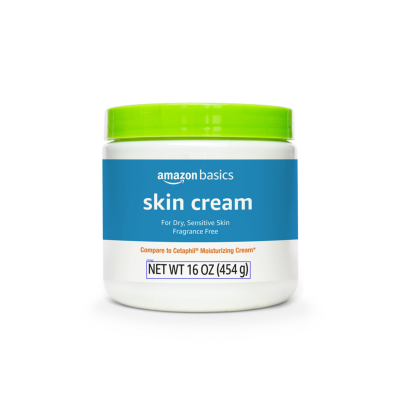

1004.jpg
Weight of the object is 250.0 ml


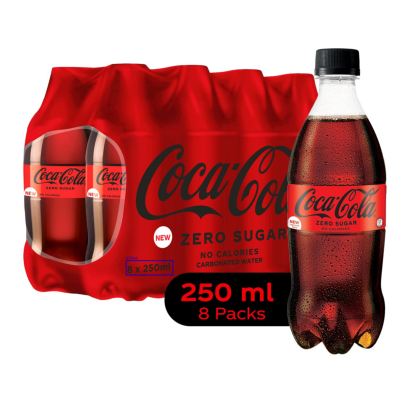

1010.jpg
Unable to detect weight


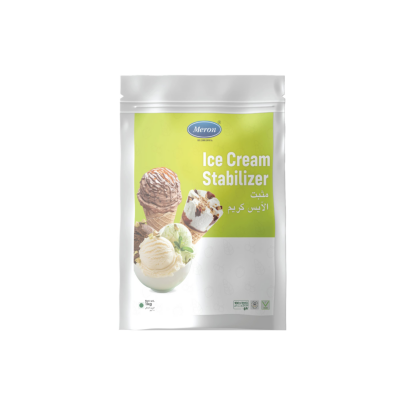

1011.jpg
Unable to detect weight


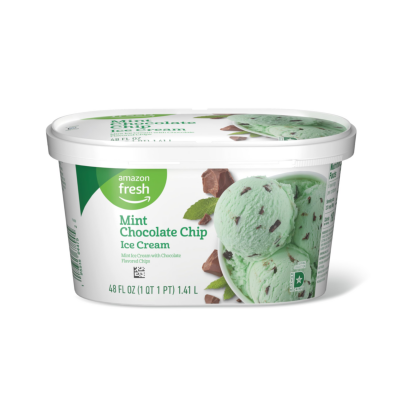

1005.jpg
Unable to detect weight


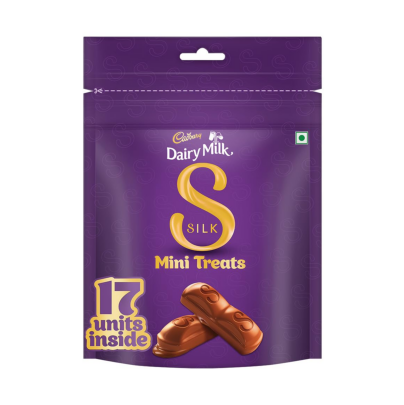

1039.jpg
Unable to detect weight


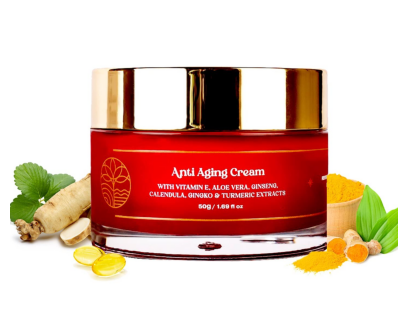

1013.jpg
Unable to detect weight


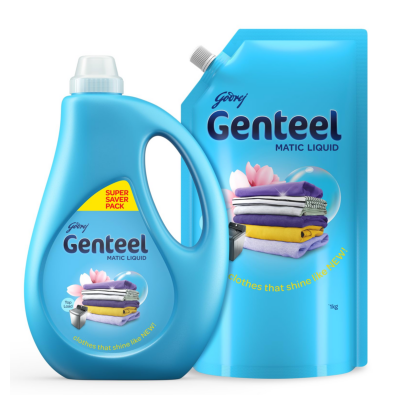

1007.jpg
Weight of the object is 60.0 g


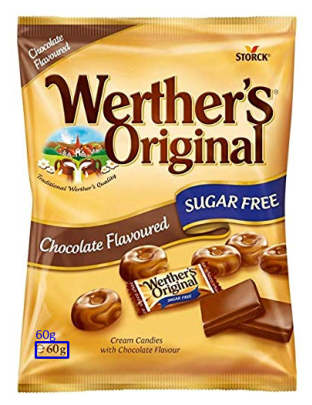

1006.jpg
Weight of the object is 500.0 g


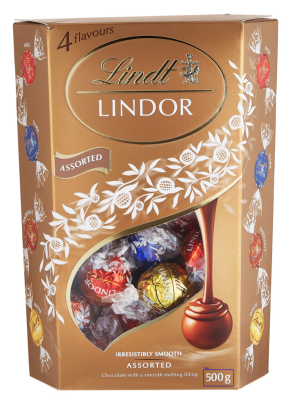

1012.jpg
Weight of the object is 17.0 g


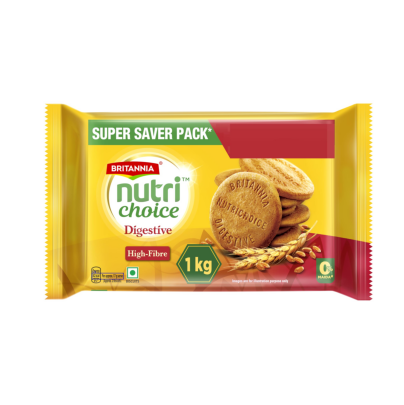

1016.jpg
1000.0 g
Weight of the object is 1.0 kg


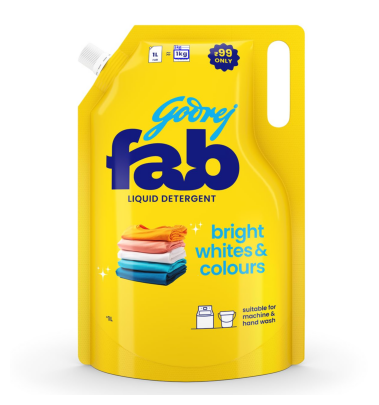

1002.jpg
Weight of the object is 330.0 ml


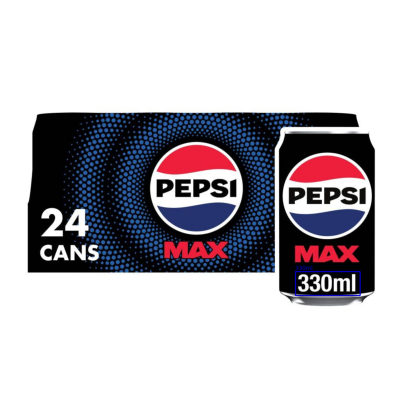

1003.jpg
Unable to detect weight


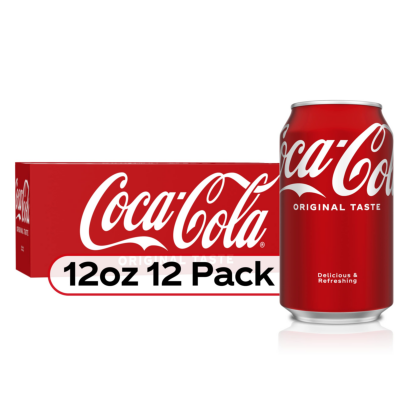

1017.jpg
Unable to detect weight


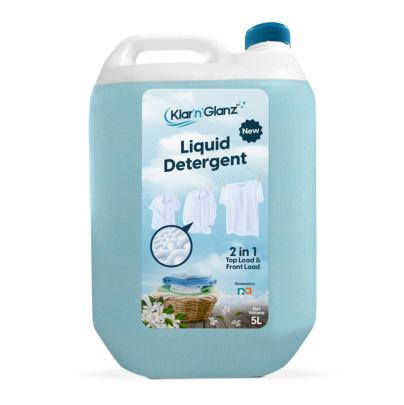

1001.jpg
Weight of the object is 70.0 g


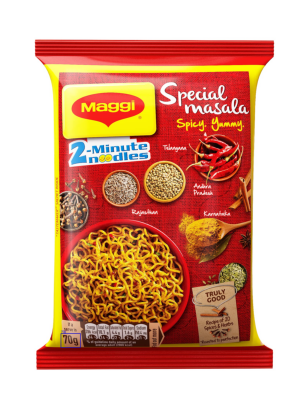

1015.jpg
Unable to detect weight


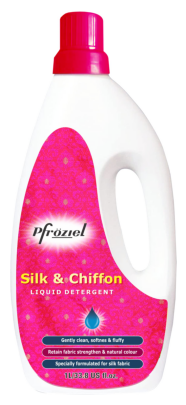

1029.jpg
Weight of the object is 100.0  g


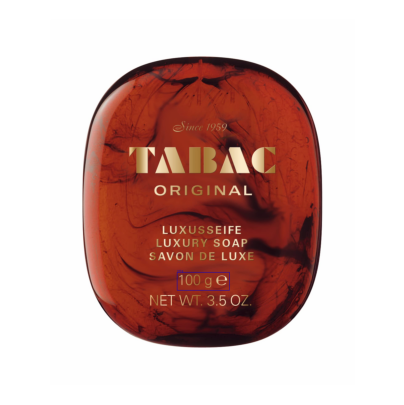

1028.jpg
Weight of the object is 100.0  g


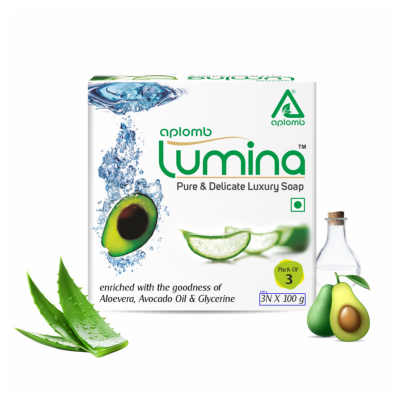

1014.jpg
Unable to detect weight


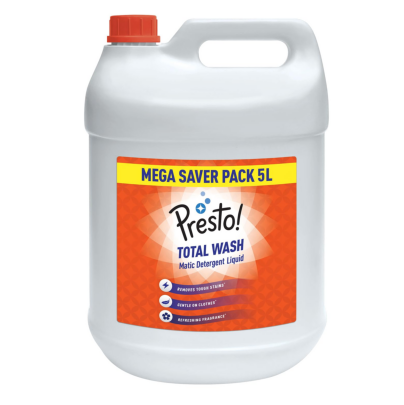

In [19]:
i=0
cnt = 0
wrong = []
for image in paths:
    img = cv2.imread(image)
    img_original = img.copy()
    file_image = os.path.split(image)[-1]
    print('=================\n' + str(file_image))
    
    img, max_value = ocr_process_img(img, config_tesseract, min_conf)
    if max_value is None or max_value == -1:
        print("Unable to detect weight")
        show_img(img)
        cnt += 1
        wrong.append(file_image)
    else:
        print('Weight of the object is {}'.format(max_value))
        show_img(img)
    i+=1

In [20]:
# Accuracy
acc = (100-cnt)/100
acc

0.65

In [21]:
# rm -rf ../images